In [1]:
import os
import glob
import random
import numpy as np
import nibabel as nib
import cv2

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt

from dataAug import *


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
autism_dir = "preproc_out/autism"
control_dir = "preproc_out/control"
autism_files = glob.glob(os.path.join(autism_dir, "*.nii"))
control_files = glob.glob(os.path.join(control_dir, "*.nii"))

autism_list = [(f, 1) for f in autism_files]
control_list = [(f, 0) for f in control_files]
all_list = autism_list + control_list
random.shuffle(all_list)
labels = [lbl for (_, lbl) in all_list]

train_list, test_list = train_test_split(
    all_list, test_size=0.4, stratify=labels, random_state=42
)

train_dataset = AutismDataset_raw(train_list, transform=None)
test_dataset  = AutismDataset_raw(test_list,  transform=None)

train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_loader  = DataLoader(test_dataset,  batch_size=128, shuffle=False)
print(f"Train samples: {len(train_dataset)}  |  Test samples: {len(test_dataset)}")

for images, labels in train_loader:
    print("Batch shape:", images.shape, "Labels:", labels)
    break



Train samples: 4112  |  Test samples: 2721
Batch shape: torch.Size([128, 1, 224, 224]) Labels: tensor([1., 0., 1., 1., 0., 1., 1., 1., 0., 1., 0., 0., 0., 1., 1., 0., 1., 0.,
        1., 1., 0., 1., 0., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 0.,
        1., 0., 0., 1., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 1., 1., 1., 0.,
        0., 0., 1., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 0., 0., 1., 1.,
        0., 0., 0., 0., 1., 1., 0., 0., 1., 1., 0., 0., 1., 1., 0., 0., 1., 1.,
        0., 0., 1., 0., 1., 1., 0., 0., 1., 1., 1., 0., 1., 1., 1., 1., 0., 1.,
        1., 1., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 1.,
        0., 1.], dtype=torch.float64)


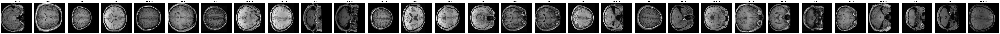

In [4]:
images_batch, labels_batch = next(iter(train_loader))
    
show_images(images_batch, labels_batch, num_images=30)

cuda
Train samples: 4112 | Test samples: 2721
0


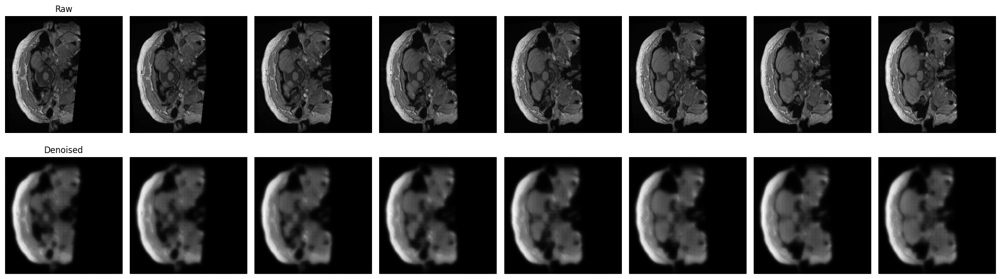

Epoch: 1/20, Train Loss: 0.013494, Val Loss: 0.006800
1


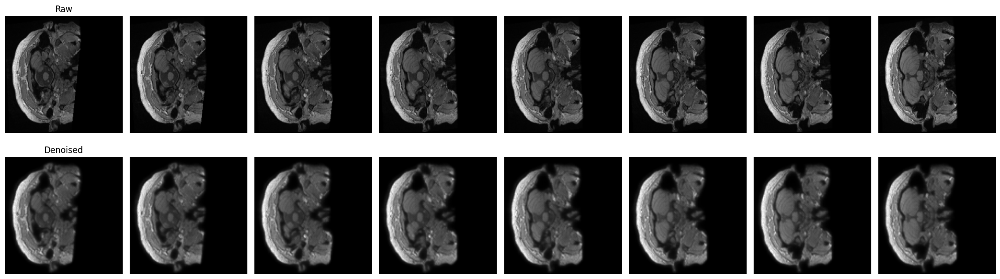

Epoch: 2/20, Train Loss: 0.000851, Val Loss: 0.000881
2


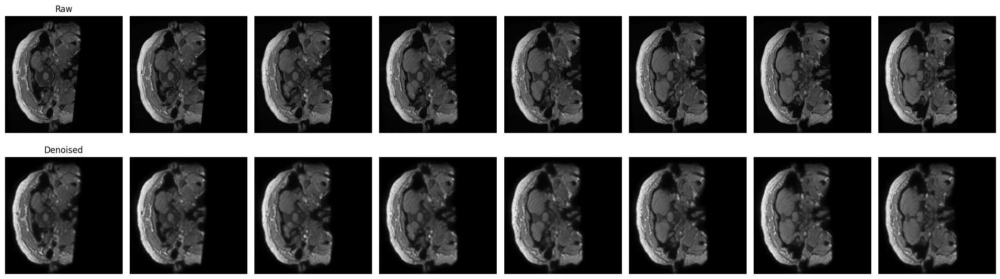

Epoch: 3/20, Train Loss: 0.000582, Val Loss: 0.000465
3


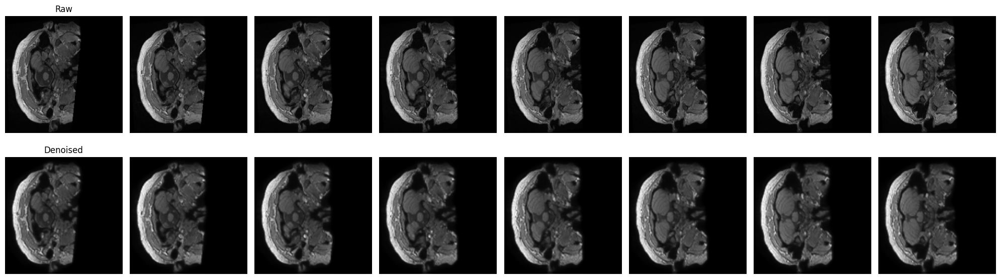

Epoch: 4/20, Train Loss: 0.000540, Val Loss: 0.000475
4


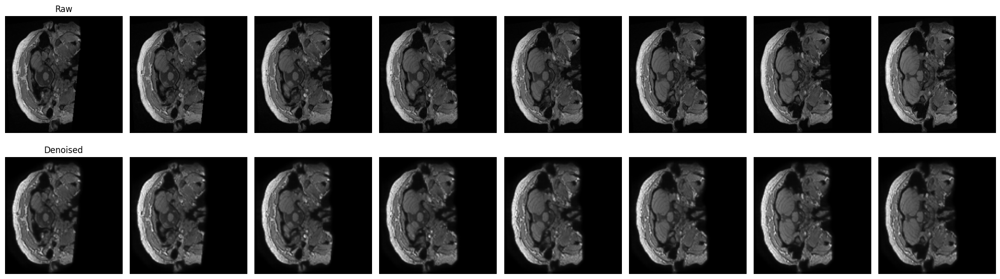

Epoch: 5/20, Train Loss: 0.000464, Val Loss: 0.000490
5


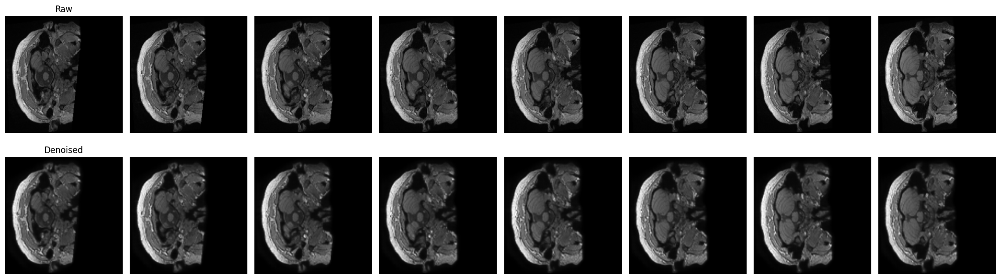

Epoch: 6/20, Train Loss: 0.000428, Val Loss: 0.000428
6


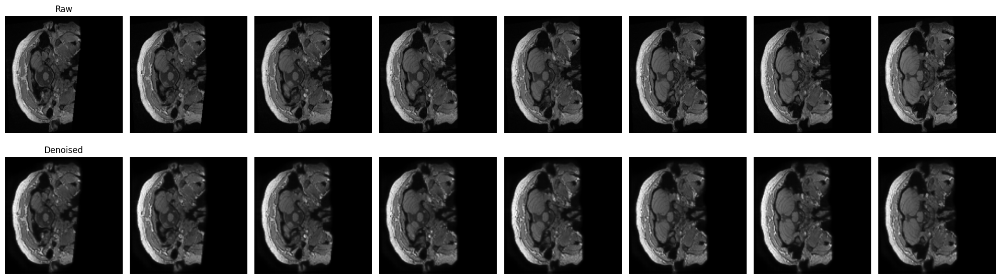

Epoch: 7/20, Train Loss: 0.000417, Val Loss: 0.000460
7


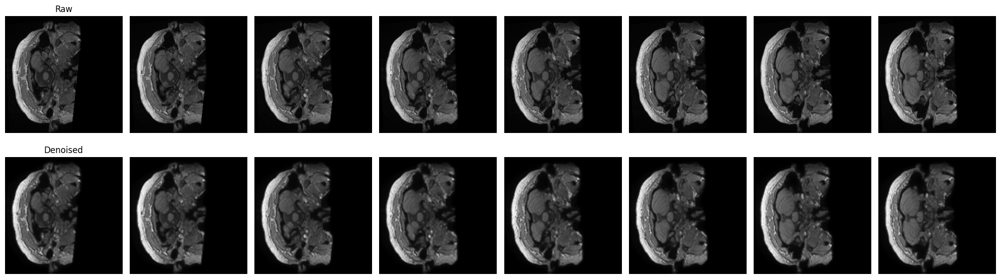

Epoch: 8/20, Train Loss: 0.000438, Val Loss: 0.000506
8


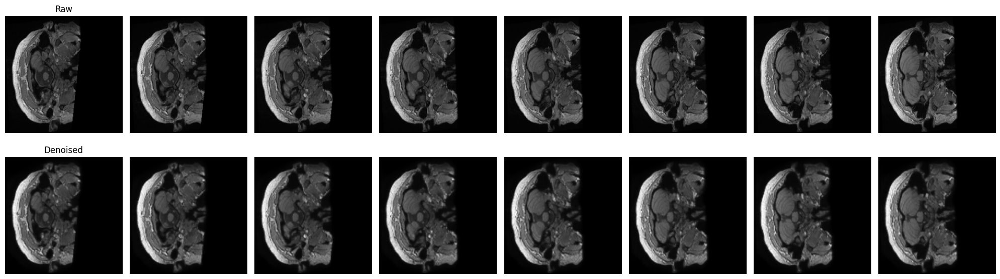

Epoch: 9/20, Train Loss: 0.000430, Val Loss: 0.000723
9


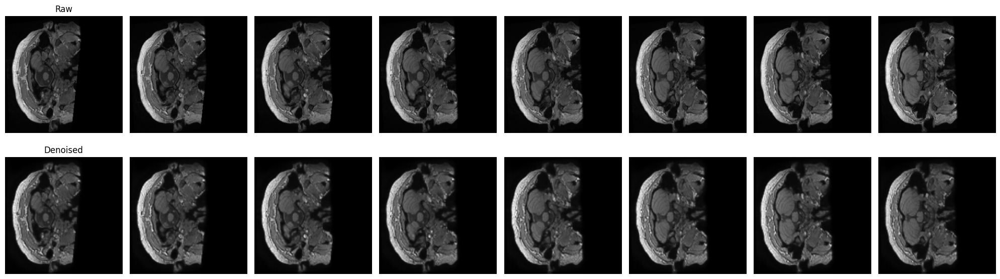

Epoch: 10/20, Train Loss: 0.000436, Val Loss: 0.000436
10


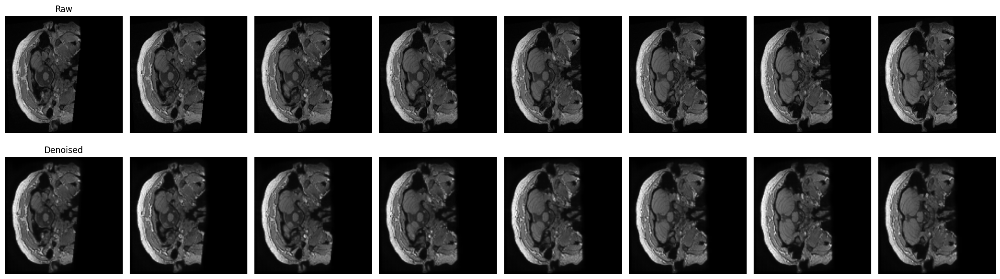

Epoch: 11/20, Train Loss: 0.000479, Val Loss: 0.000320
11


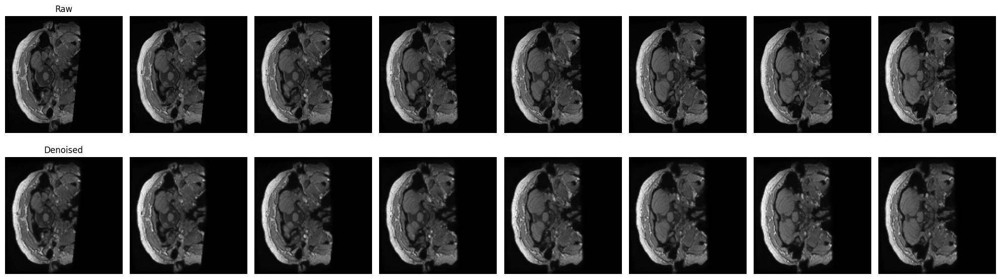

Epoch: 12/20, Train Loss: 0.000342, Val Loss: 0.000276
12


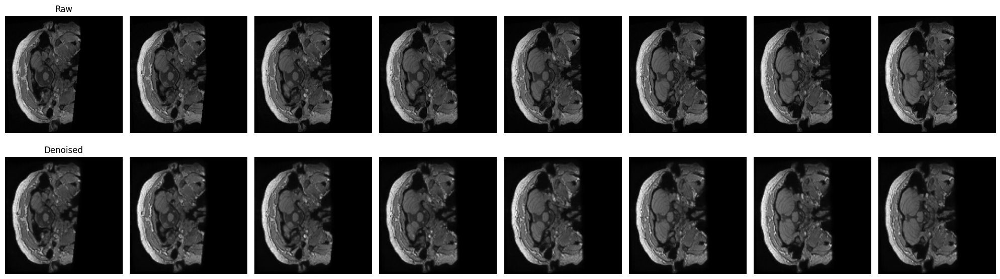

Epoch: 13/20, Train Loss: 0.000299, Val Loss: 0.000365
13


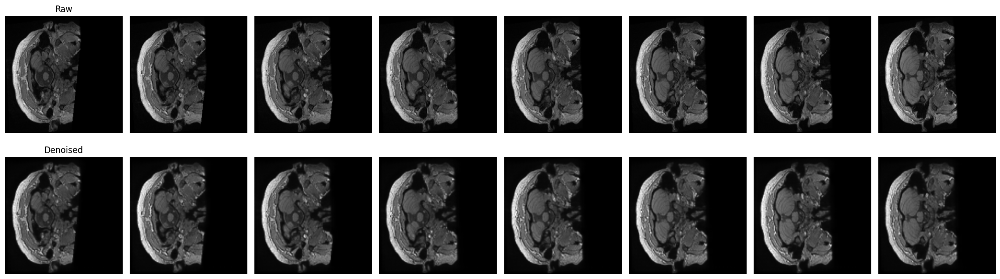

Epoch: 14/20, Train Loss: 0.000314, Val Loss: 0.000325
14


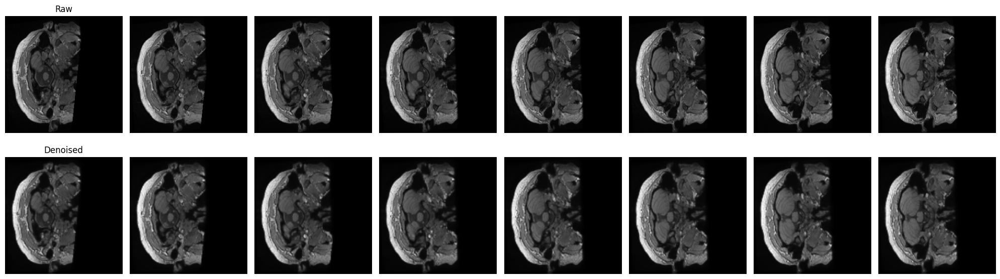

Epoch: 15/20, Train Loss: 0.000341, Val Loss: 0.000393
15


In [ ]:
import torch
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.nn import CrossEntropyLoss, BCELoss, BCEWithLogitsLoss
from denoise import *
batch_size =  128
epochs = 20
lr = 0.001
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
model = DenoisingAutoencoder().to(device)


train_losses, val_losses = train_model(
    model,train_loader, test_loader, 
    batch_size=batch_size,epochs=epochs,lr=lr,device=device
)

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.savefig('loss_plot.png')


# Save the model
torch.save(model.state_dict(), 'denoising_autoencoder.pth')

print('Done!')